In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [4]:
df.shape

(1000, 40)

In [5]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [6]:
df=df.replace('?',np.NaN)

In [7]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [8]:
df['property_damage'].fillna(df['property_damage'].mode()[0],inplace=True)
df['police_report_available'].fillna(df['police_report_available'].mode()[0],inplace=True)
df['collision_type'].fillna(df['collision_type'].mode()[0],inplace=True)

In [9]:
df.drop(['_c39','incident_location','insured_zip','policy_number'],axis=1,inplace=True)

In [10]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

In [11]:
df.drop(['policy_bind_date','incident_date','policy_csl'],axis=1,inplace=True)

In [12]:
df.drop("auto_year",axis=1,inplace=True)

In [13]:
Category = ['policy_state',  'insured_sex', 'insured_education_level', 'insured_occupation', 
            'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity',
            'authorities_contacted','incident_state', 'incident_city', 'property_damage','police_report_available',
            'auto_make','auto_model', 'fraud_reported']

Numerical = ['months_as_customer','CSL_Personal','CSL_Accidental', 'age', 'policy_deductable', 'umbrella_limit', 'capital-gains', 'capital-loss', 
             'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 
             'total_claim_amount','injury_claim', 'property_claim', 'vehicle_claim', 'Automobile_Age','policy_annual_premium']

In [14]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000


N    753
Y    247
Name: fraud_reported, dtype: int64


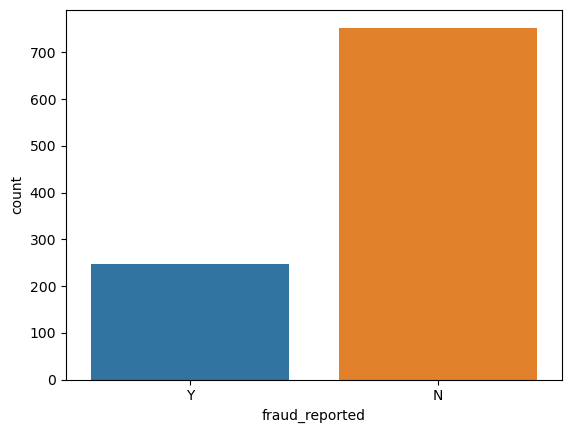

In [15]:
ax = sns.countplot(x = 'fraud_reported', data=df)
print(df['fraud_reported'].value_counts())

NO     686
YES    314
Name: police_report_available, dtype: int64


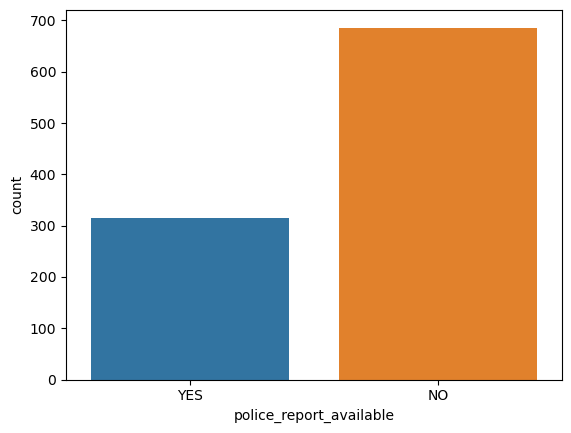

In [16]:
ax = sns.countplot(x = 'police_report_available', data=df)
print(df['police_report_available'].value_counts())

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


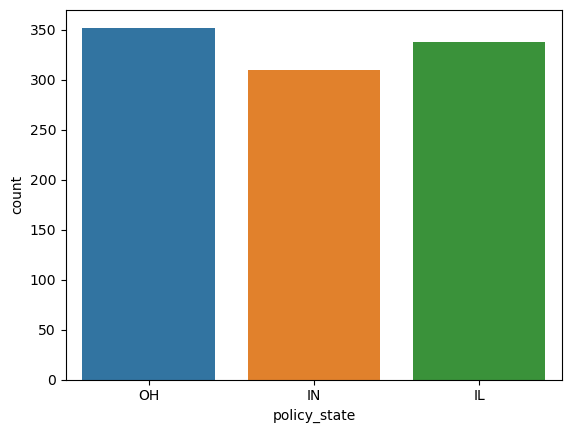

In [17]:
ax = sns.countplot(x = 'policy_state', data=df)
print(df['policy_state'].value_counts())

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


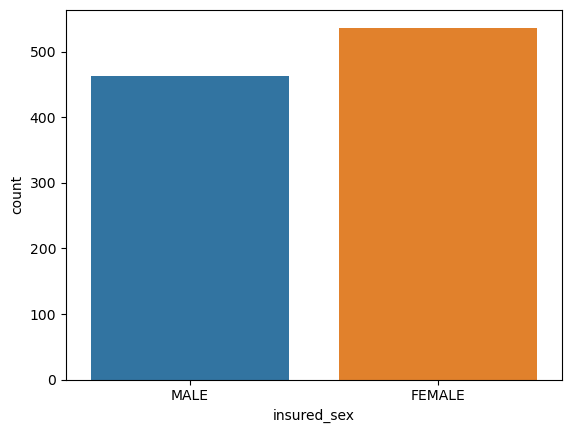

In [18]:
ax = sns.countplot(x = 'insured_sex', data=df)
print(df['insured_sex'].value_counts())

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


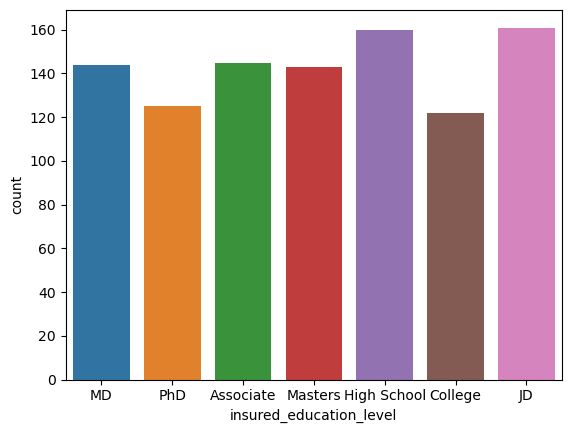

In [19]:
ax = sns.countplot(x = 'insured_education_level', data=df)
print(df['insured_education_level'].value_counts())

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'craft-repair'),
  Text(1, 0, 'machine-op-inspct'),
  Text(2, 0, 'sales'),
  Text(3, 0, 'armed-forces'),
  Text(4, 0, 'tech-support'),
  Text(5, 0, 'prof-specialty'),
  Text(6, 0, 'other-service'),
  Text(7, 0, 'priv-house-serv'),
  Text(8, 0, 'exec-managerial'),
  Text(9, 0, 'protective-serv'),
  Text(10, 0, 'transport-moving'),
  Text(11, 0, 'handlers-cleaners'),
  Text(12, 0, 'adm-clerical'),
  Text(13, 0, 'farming-fishing')])

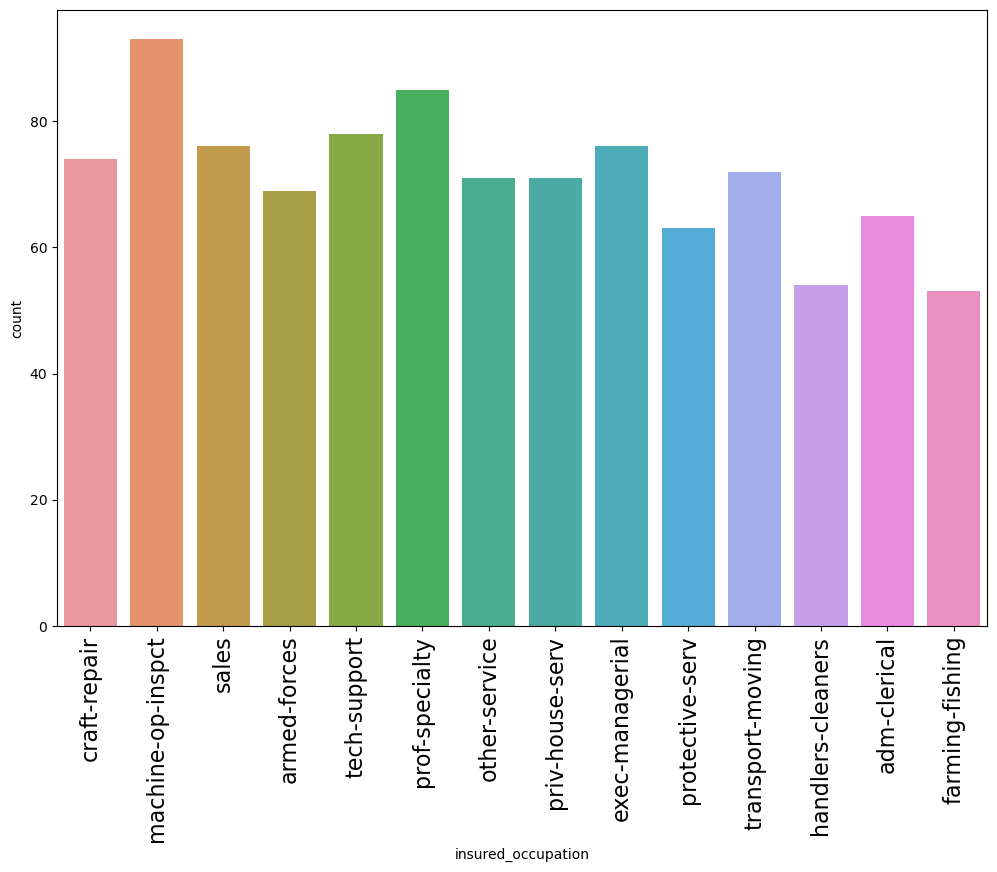

In [20]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x = 'insured_occupation', data=df)
print(df['insured_occupation'].value_counts())
plt.xticks(fontsize=16,rotation=90)

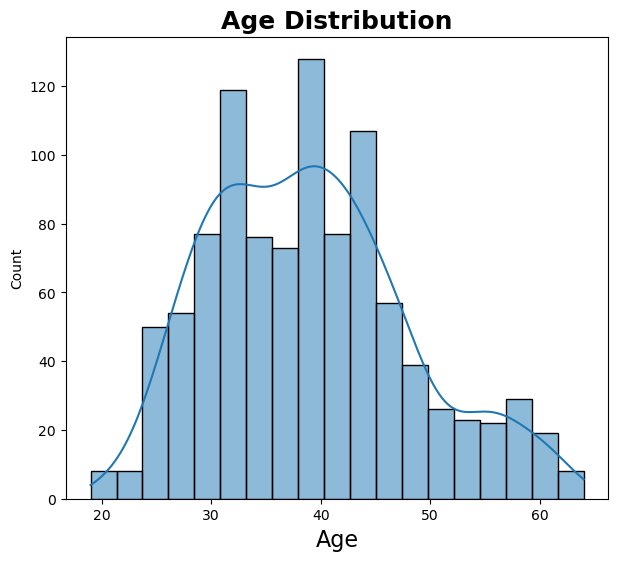

In [21]:
plt.figure(figsize=(7,6))
sns.histplot(df.age, kde=True)
plt.xlabel('Age',fontsize=16)
plt.title('Age Distribution', fontsize=18,fontweight ='bold')
plt.show()

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'sleeping'),
  Text(1, 0, 'reading'),
  Text(2, 0, 'board-games'),
  Text(3, 0, 'bungie-jumping'),
  Text(4, 0, 'base-jumping'),
  Text(5, 0, 'golf'),
  Text(6, 0, 'camping'),
  Text(7, 0, 'dancing'),
  Text(8, 0, 'skydiving'),
  Text(9, 0, 'movies'),
  Text(10, 0, 'hiking'),
  Text(11, 0, 'yachting'),
  Text(12, 0, 'paintball'),
  Text(13, 0, 'chess'),
  Text(14, 0, 'kayaking'),
  Text(15, 0, 'polo'),
  Text(16, 0, 'basketball'),
  Text(17, 0, 'video-games'),
  Text(18, 0, 'cross-fit'),
  Text(19, 0, 'exercise')])

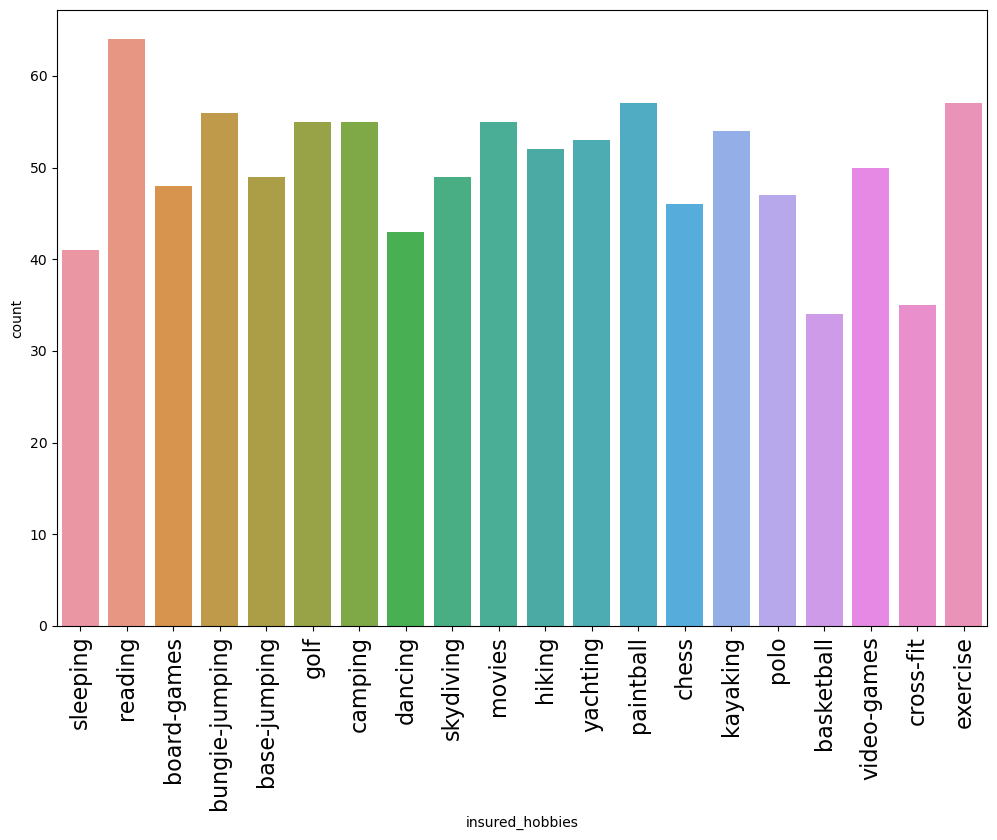

In [22]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x = 'insured_hobbies', data=df)
print(df['insured_hobbies'].value_counts())
plt.xticks(fontsize=16,rotation=90)

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


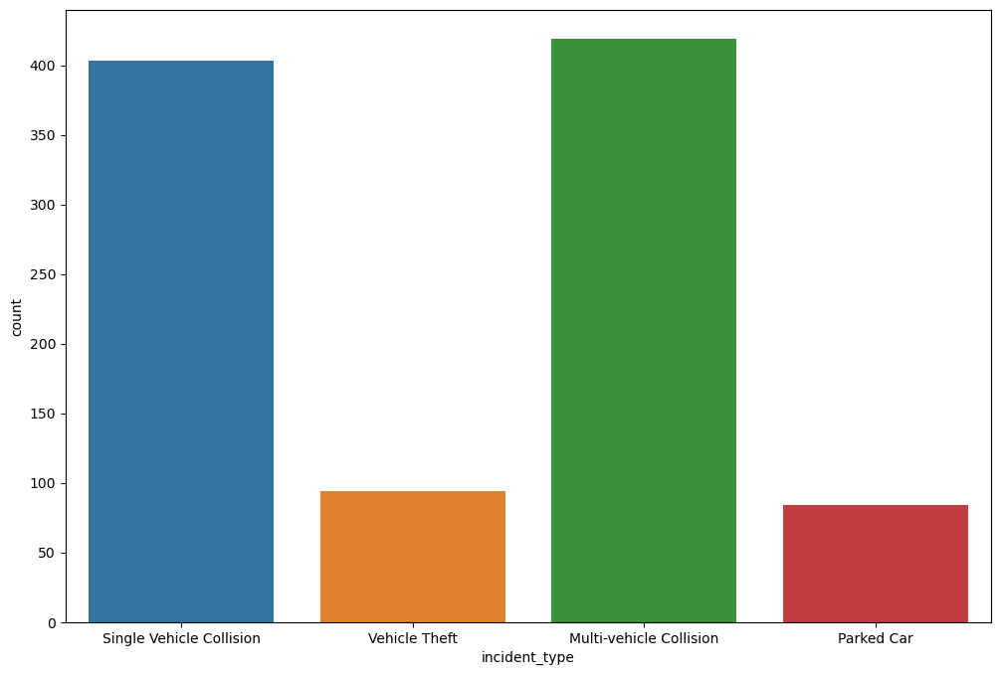

In [23]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x = 'incident_type', data=df)
print(df['incident_type'].value_counts())

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


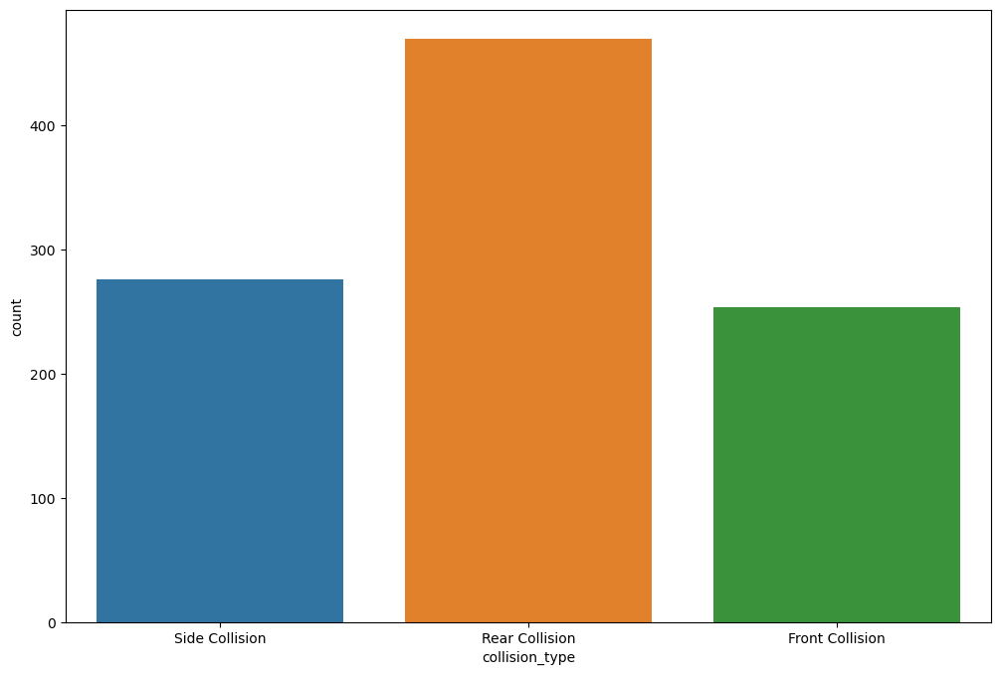

In [24]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x = 'collision_type', data=df)
print(df['collision_type'].value_counts())

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


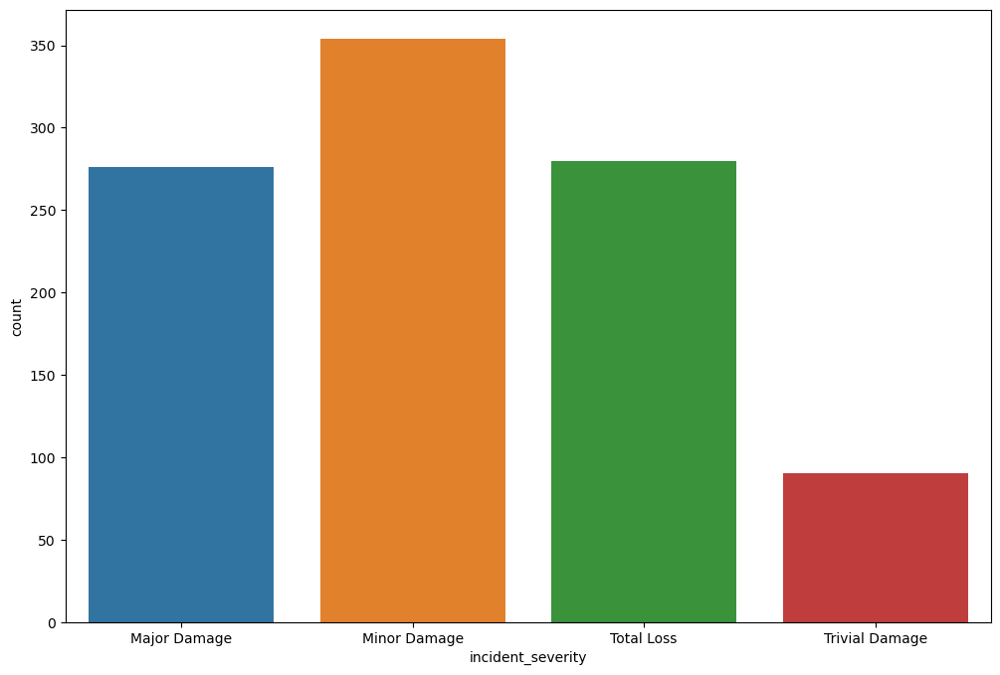

In [25]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x = 'incident_severity', data=df)
print(df['incident_severity'].value_counts())

NO     698
YES    302
Name: property_damage, dtype: int64


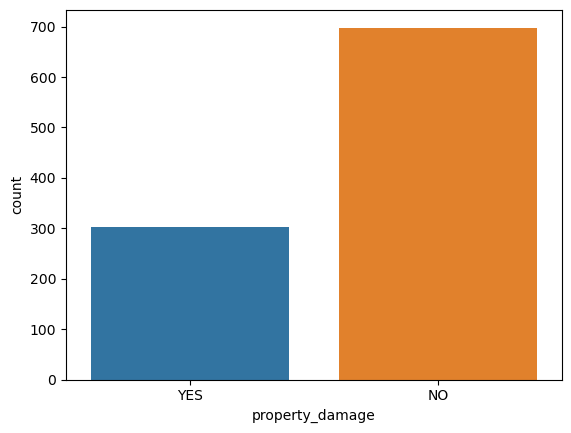

In [26]:
ax = sns.countplot(x = 'property_damage', data=df)
print(df['property_damage'].value_counts())

In [27]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in Category:
    df[i] = le.fit_transform(df[i])
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2,1000,1406.91,0,1,4,2,17,...,1,2,1,71610,6510,13020,52080,10,1,1
1,228,42,1,2000,1197.22,5000000,1,4,6,15,...,0,0,0,5070,780,780,3510,8,12,1
2,134,29,2,2000,1413.14,5000000,0,6,11,2,...,2,3,0,34650,7700,3850,23100,4,30,0
3,256,41,0,2000,1415.74,6000000,0,6,1,2,...,1,2,0,63400,6340,6340,50720,3,34,1
4,228,44,0,1000,1583.91,6000000,1,0,11,2,...,0,1,0,6500,1300,650,4550,0,31,0


In [28]:
sns.pairplot(data=df)
plt.show()

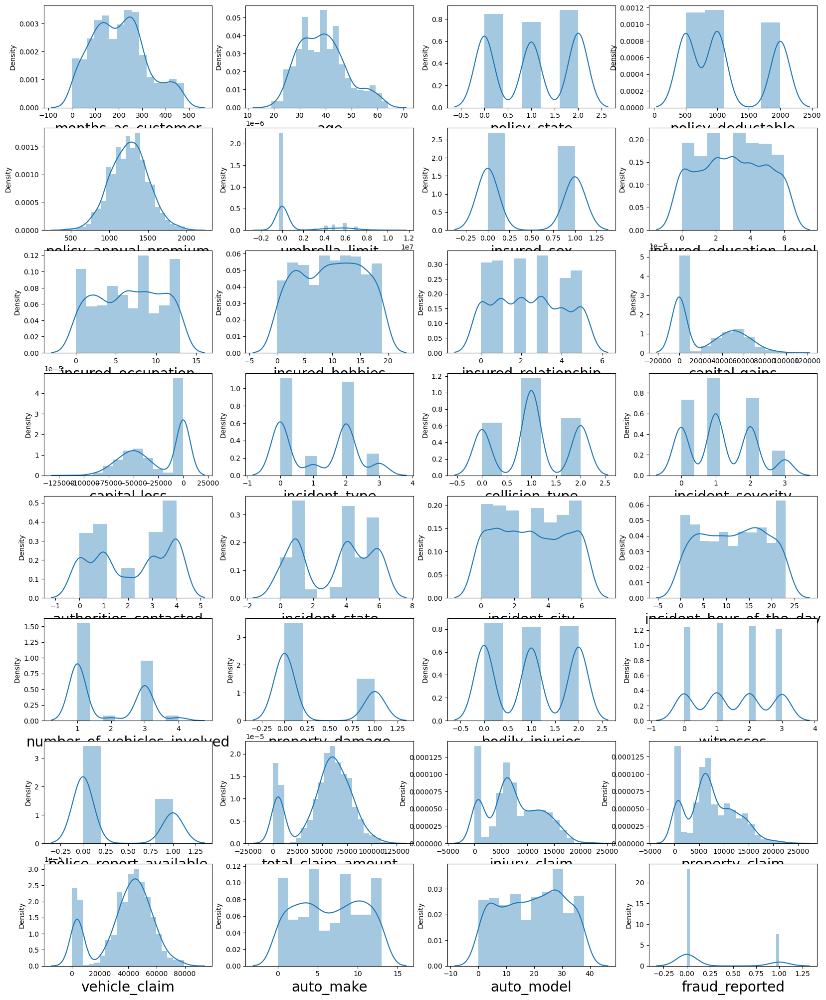

In [29]:
plt.figure(figsize=(20,25))
plotnumber=1

for column in df:
    if plotnumber<=32:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
    
plt.show()

In [30]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777
witnesses                      0.019636
police_report_available        0.802728


In [31]:
df['umbrella_limit'] = np.cbrt(df['umbrella_limit'])

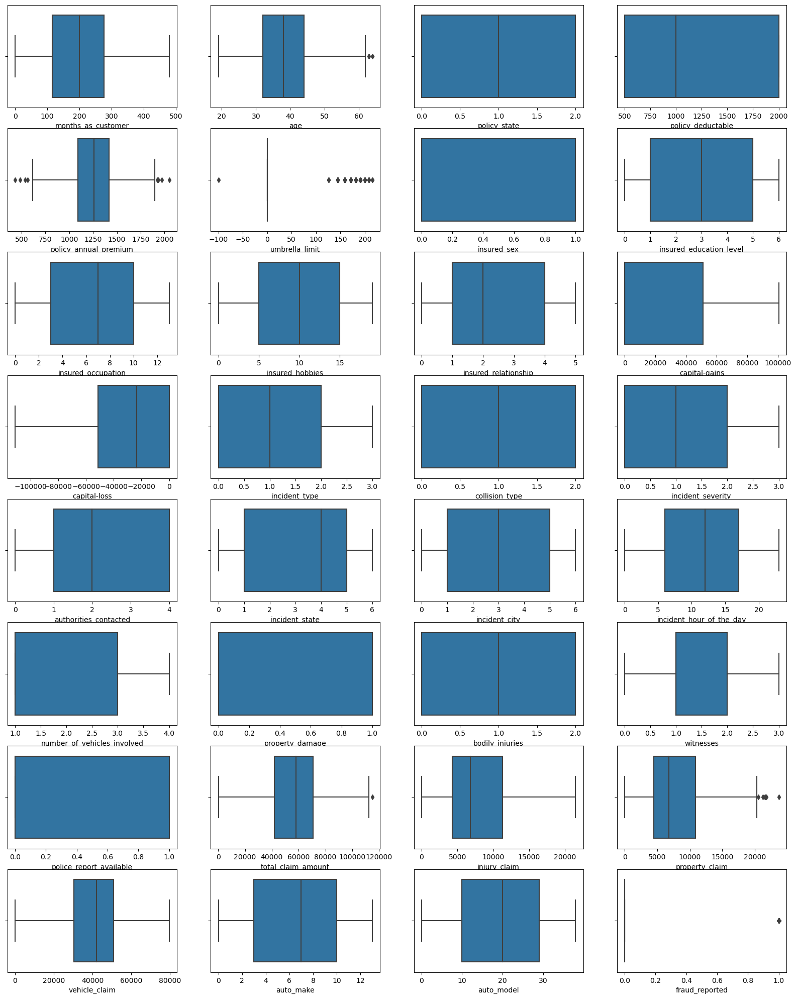

In [32]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=32:
        plt.subplot(8,4,p)
        sns.boxplot(df[i])
        plt.xlabel(i)
        
    p+=1
plt.show()

In [33]:
from scipy.stats import zscore
out_feature = df[['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim']]
z = np.abs(zscore(out_feature))
z

,age,policy_annual_premium,umbrella_limit,total_claim_amount,property_claim
0,0.990836,0.616705,0.496576,0.714257,1.165505
1,0.334073,0.242521,1.926648,1.807312,1.372696
2,1.088913,0.642233,1.926648,0.686362,0.736072
3,0.224613,0.652886,2.078484,0.403135,0.219722
4,0.552994,1.341980,2.078484,1.753121,1.399654
...,...,...,...,...,...
995,0.103769,0.222884,0.496576,1.305049,0.273817
996,0.224613,0.739141,0.496576,2.111466,2.214794
997,0.541611,0.520739,1.547250,0.558507,0.020826
998,2.523284,0.411866,1.926648,0.219110,0.451976


In [34]:
np.where(z>3)

(array([229, 248, 500, 763], dtype=int64), array([1, 1, 4, 1], dtype=int64))

In [35]:
df1 = df[(z<3).all(axis=1)]
df1.shape

(996, 32)

In [36]:
df1

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2,1000,1406.91,0.000000,1,4,2,17,...,1,2,1,71610,6510,13020,52080,10,1,1
1,228,42,1,2000,1197.22,170.997595,1,4,6,15,...,0,0,0,5070,780,780,3510,8,12,1
2,134,29,2,2000,1413.14,170.997595,0,6,11,2,...,2,3,0,34650,7700,3850,23100,4,30,0
3,256,41,0,2000,1415.74,181.712059,0,6,1,2,...,1,2,0,63400,6340,6340,50720,3,34,1
4,228,44,0,1000,1583.91,181.712059,1,0,11,2,...,0,1,0,6500,1300,650,4550,0,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0.000000,0,5,2,13,...,0,1,0,87200,17440,8720,61040,6,6,0
996,285,41,0,1000,1436.79,0.000000,0,6,9,17,...,2,3,0,108480,18080,18080,72320,13,28,0
997,130,34,2,500,1383.49,144.224957,0,5,1,3,...,2,3,1,67500,7500,7500,52500,11,19,0
998,458,62,0,2000,1356.92,170.997595,1,0,5,0,...,0,1,1,46980,5220,5220,36540,1,5,0


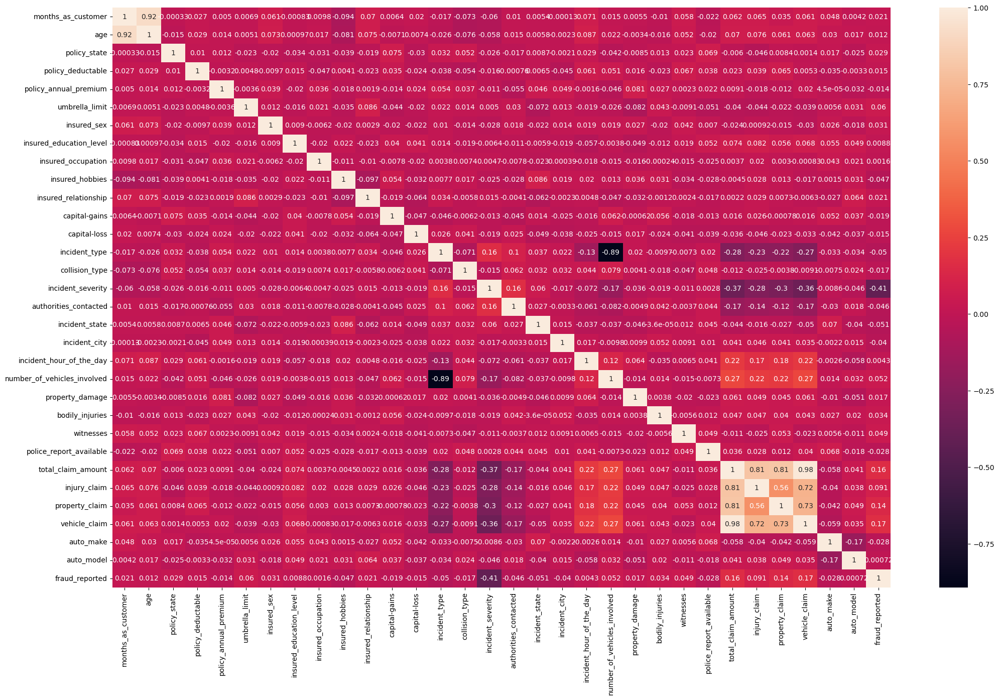

In [38]:
plt.figure(figsize=(25,15))

sns.heatmap(df.corr(),annot=True)

plt.show()

In [39]:
x = df1.drop('fraud_reported',axis=1)
y = df1['fraud_reported']

In [40]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x_scaler,i) for i in range(x_scaler.shape[1])]
vif['Features'] = x.columns

vif

,vif,Features
0,6.822772,months_as_customer
1,6.836681,age
2,1.030889,policy_state
3,1.037185,policy_deductable
4,1.031846,policy_annual_premium
5,1.032189,umbrella_limit
6,1.023425,insured_sex
7,1.036764,insured_education_level
8,1.013941,insured_occupation
9,1.047657,insured_hobbies


In [42]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

In [43]:
maxAccu=0
maxRS=0
for i in range(0,500):
    x_train,x_test,y_train,y_test = train_test_split(x_scaler,y,test_size = 0.3, random_state=i)
    log_reg=LogisticRegression()
    log_reg.fit(x_train,y_train)
    y_pred=log_reg.predict(x_test)
    acc=accuracy_score(y_test,y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu ,'on Random_state', maxRS)

Best accuracy is 0.8327759197324415 on Random_state 386


In [44]:
x_train,x_test,y_train,y_test = train_test_split(x_scaler,y,test_size = 0.30, random_state=386)

In [45]:
def metric_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        y_pred = clf.predict(x_train)
        
        print('\n==================Train Result=====================')
        print(f'Accuracy Score: {accuracy_score(y_train,y_pred)*100:.2f}%')
        
        
    elif train==False:
        pred = clf.predict(x_test)
        
        print('\n==================Test Result======================')
        print(f'Accuracy Score: {accuracy_score(y_test,pred)*100:.2f}%')
        
        
        print('\n Classification Report', classification_report(y_test,pred,digits=2))

In [46]:
Lr = LogisticRegression()
Lr.fit(x_train,y_train)

LogisticRegression()

In [47]:
metric_score(Lr,x_train,x_test,y_train,y_test, train = True)
metric_score(Lr,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 79.48%

==================Test Result======================
Accuracy Score: 83.28%

 Classification Report               precision    recall  f1-score   support

           0       0.89      0.90      0.90       241
           1       0.57      0.53      0.55        58

    accuracy                           0.83       299
   macro avg       0.73      0.72      0.73       299
weighted avg       0.83      0.83      0.83       299



In [48]:
Dt = DecisionTreeClassifier()
Dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [49]:
metric_score(Dt,x_train,x_test,y_train,y_test, train = True)
metric_score(Dt,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 100.00%

==================Test Result======================
Accuracy Score: 78.60%

 Classification Report               precision    recall  f1-score   support

           0       0.90      0.83      0.86       241
           1       0.46      0.62      0.53        58

    accuracy                           0.79       299
   macro avg       0.68      0.72      0.70       299
weighted avg       0.82      0.79      0.80       299



In [51]:
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [52]:
metric_score(knn,x_train,x_test,y_train,y_test, train = True)
metric_score(knn,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 79.48%

==================Test Result======================
Accuracy Score: 75.59%

 Classification Report               precision    recall  f1-score   support

           0       0.81      0.91      0.86       241
           1       0.22      0.10      0.14        58

    accuracy                           0.76       299
   macro avg       0.52      0.51      0.50       299
weighted avg       0.70      0.76      0.72       299



In [53]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

RandomForestClassifier()

In [54]:
metric_score(RFC,x_train,x_test,y_train,y_test, train = True)
metric_score(RFC,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 100.00%

==================Test Result======================
Accuracy Score: 83.61%

 Classification Report               precision    recall  f1-score   support

           0       0.89      0.91      0.90       241
           1       0.58      0.53      0.56        58

    accuracy                           0.84       299
   macro avg       0.74      0.72      0.73       299
weighted avg       0.83      0.84      0.83       299



In [55]:
Abc = AdaBoostClassifier()
Abc.fit(x_train,y_train)

AdaBoostClassifier()

In [56]:
metric_score(Abc,x_train,x_test,y_train,y_test, train = True)
metric_score(Abc,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 86.66%

==================Test Result======================
Accuracy Score: 81.61%

 Classification Report               precision    recall  f1-score   support

           0       0.91      0.86      0.88       241
           1       0.52      0.64      0.57        58

    accuracy                           0.82       299
   macro avg       0.71      0.75      0.73       299
weighted avg       0.83      0.82      0.82       299



In [57]:
Gbc = GradientBoostingClassifier()
Gbc.fit(x_train,y_train)

GradientBoostingClassifier()

In [58]:
metric_score(Gbc,x_train,x_test,y_train,y_test, train = True)
metric_score(Gbc,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 96.99%

==================Test Result======================
Accuracy Score: 84.62%

 Classification Report               precision    recall  f1-score   support

           0       0.94      0.87      0.90       241
           1       0.58      0.76      0.66        58

    accuracy                           0.85       299
   macro avg       0.76      0.81      0.78       299
weighted avg       0.87      0.85      0.85       299



In [59]:
Etc = ExtraTreesClassifier()
Etc.fit(x_train,y_train)

ExtraTreesClassifier()

In [60]:
metric_score(Etc,x_train,x_test,y_train,y_test, train = True)
metric_score(Etc,x_train,x_test,y_train,y_test,train= False)



==================Train Result=====================
Accuracy Score: 100.00%

==================Test Result======================
Accuracy Score: 80.60%

 Classification Report               precision    recall  f1-score   support

           0       0.84      0.93      0.89       241
           1       0.50      0.28      0.36        58

    accuracy                           0.81       299
   macro avg       0.67      0.60      0.62       299
weighted avg       0.78      0.81      0.78       299



In [61]:
bc = BaggingClassifier()
bc.fit(x_train,y_train)

BaggingClassifier()

In [62]:
metric_score(bc,x_train,x_test,y_train,y_test, train = True)
metric_score(bc,x_train,x_test,y_train,y_test,train= False)


==================Train Result=====================
Accuracy Score: 98.85%

==================Test Result======================
Accuracy Score: 83.28%

 Classification Report               precision    recall  f1-score   support

           0       0.92      0.87      0.89       241
           1       0.56      0.69      0.62        58

    accuracy                           0.83       299
   macro avg       0.74      0.78      0.75       299
weighted avg       0.85      0.83      0.84       299



In [63]:
score = cross_val_score(Lr,x,y)
print(score)
print(score.mean())

[0.755      0.74874372 0.72361809 0.74874372 0.75879397]
0.7469798994974874


In [64]:
score = cross_val_score(Dt,x,y)
print(score)
print(score.mean())

[0.745      0.75879397 0.7638191  0.76884422 0.81407035]
0.770105527638191


In [65]:
score = cross_val_score(knn,x,y)
print(score)
print(score.mean())

[0.67       0.67336683 0.71859296 0.68844221 0.71356784]
0.6927939698492462


In [66]:
score = cross_val_score(RFC,x,y)
print(score)
print(score.mean())

[0.795      0.75376884 0.74874372 0.77386935 0.78894472]
0.7720653266331657


In [67]:
score = cross_val_score(Abc,x,y)
print(score)
print(score.mean())

[0.815      0.78894472 0.75879397 0.82914573 0.86432161]
0.8112412060301507


In [68]:
score = cross_val_score(Gbc,x,y)
print(score)
print(score.mean())

[0.82       0.76884422 0.79899497 0.84422111 0.84924623]
0.8162613065326634


In [69]:
score = cross_val_score(Etc,x,y)
print(score)
print(score.mean())

[0.77       0.74874372 0.74874372 0.79396985 0.79396985]
0.7710854271356784


In [70]:
score = cross_val_score(bc,x,y)
print(score)
print(score.mean())

[0.805      0.77386935 0.80904523 0.81909548 0.79396985]
0.8001959798994974


In [71]:
from sklearn.model_selection import GridSearchCV

In [72]:
grid_param = {'n_estimators':[10,15,20,25,30],
              'max_depth' : range(16,64),
              'min_samples_split':range(2,8,2),
              'learning_rate':np.arange(0.1,0.3)
              
    
}

In [73]:
grid = GridSearchCV(GradientBoostingClassifier(),param_grid=grid_param)

grid.fit(x_train,y_train)

GridSearchCV(estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': array([0.1]),
                         'max_depth': range(16, 64),
                         'min_samples_split': range(2, 8, 2),
                         'n_estimators': [10, 15, 20, 25, 30]})

In [74]:
grid.best_params_

{'learning_rate': 0.1,
 'max_depth': 34,
 'min_samples_split': 6,
 'n_estimators': 30}

In [75]:
model = GradientBoostingClassifier(learning_rate =0.1,max_depth = 34,min_samples_split= 6,n_estimators= 30)
model.fit(x_train,y_train)
pred = model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

80.93645484949833


In [76]:
import joblib
joblib.dump(model,'Insurance_claim.pkl')

['Insurance_claim.pkl']